In [ ]:
import numpy as np
import pandas as pd
import json
import plotly.express as px
from datetime import *

In [ ]:
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

import matplotlib.pyplot as plt

In [ ]:
df = pd.read_csv('US_youtube_trending_data.csv', engine='python')
df

,video_id,title,publishedAt,channelId,channelTitle,categoryId,trending_date,tags,view_count,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description
0,3C66w5Z0ixs,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11T19:20:14Z,UCvtRTOMP2TqYqu51xNrqAzg,Brawadis,22,2020-08-12T00:00:00Z,brawadis|prank|basketball|skits|ghost|funny vi...,1514614,156908,5855,35313,https://i.ytimg.com/vi/3C66w5Z0ixs/default.jpg,False,False,SUBSCRIBE to BRAWADIS ▶ http://bit.ly/Subscrib...
1,M9Pmf9AB4Mo,Apex Legends | Stories from the Outlands – “Th...,2020-08-11T17:00:10Z,UC0ZV6M2THA81QT9hrVWJG3A,Apex Legends,20,2020-08-12T00:00:00Z,Apex Legends|Apex Legends characters|new Apex ...,2381688,146739,2794,16549,https://i.ytimg.com/vi/M9Pmf9AB4Mo/default.jpg,False,False,"While running her own modding shop, Ramya Pare..."
2,J78aPJ3VyNs,I left youtube for a month and THIS is what ha...,2020-08-11T16:34:06Z,UCYzPXprvl5Y-Sf0g4vX-m6g,jacksepticeye,24,2020-08-12T00:00:00Z,jacksepticeye|funny|funny meme|memes|jacksepti...,2038853,353787,2628,40221,https://i.ytimg.com/vi/J78aPJ3VyNs/default.jpg,False,False,I left youtube for a month and this is what ha...
3,kXLn3HkpjaA,XXL 2020 Freshman Class Revealed - Official An...,2020-08-11T16:38:55Z,UCbg_UMjlHJg_19SZckaKajg,XXL,10,2020-08-12T00:00:00Z,xxl freshman|xxl freshmen|2020 xxl freshman|20...,496771,23251,1856,7647,https://i.ytimg.com/vi/kXLn3HkpjaA/default.jpg,False,False,Subscribe to XXL → http://bit.ly/subscribe-xxl...
4,VIUo6yapDbc,Ultimate DIY Home Movie Theater for The LaBran...,2020-08-11T15:10:05Z,UCDVPcEbVLQgLZX0Rt6jo34A,Mr. Kate,26,2020-08-12T00:00:00Z,The LaBrant Family|DIY|Interior Design|Makeove...,1123889,45802,964,2196,https://i.ytimg.com/vi/VIUo6yapDbc/default.jpg,False,False,Transforming The LaBrant Family's empty white ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92786,VfC-wAJqksU,I Mined 100 Pounds Of Silver Ore And Turned It...,2021-11-06T20:00:08Z,UCEjBDKfrqQI4TgzT9YLNT8g,Ghost Town Living,22,2021-11-12T00:00:00Z,[None],686384,46783,278,3628,https://i.ytimg.com/vi/VfC-wAJqksU/default.jpg,False,False,"If you own an abandoned silver mine, it only m..."
92787,HbV9FE8fxM0,We Improved Ocean Animals,2021-11-06T17:00:09Z,UCJGgP4txIUr_7JTDvOGVQrA,Ted Nivison,23,2021-11-12T00:00:00Z,JehBerDeh|TedNivison|Ted|Nivison|We Redesigned...,588722,76366,219,1529,https://i.ytimg.com/vi/HbV9FE8fxM0/default.jpg,False,False,We Redesigned Ocean Animals in order to save t...
92788,RfqG0Tj8nlQ,Poppy Playtime Experiment 1-0-0-7 Kissy Missy ...,2021-11-06T21:26:19Z,UCRK7B_o_4G7qXEDJtiKb2PQ,DOPEY,24,2021-11-12T00:00:00Z,Poppy Playtime|Poppy Playtime Animatic|PoppyTi...,1357714,14306,887,282,https://i.ytimg.com/vi/RfqG0Tj8nlQ/default.jpg,False,False,Poppy Playtime Experiment 1-0-0-7 Kissy Missy ...
92789,x1J_7wZWgJ8,This Minecraft Vault is Illegal... Here's Why,2021-11-06T21:30:03Z,UCk2uxbWi5py_iJXaEsh2YRA,Spoke,20,2021-11-12T00:00:00Z,Minecraft|Minecraft SMP|SMP|Minecraft Server|L...,881798,24334,591,1072,https://i.ytimg.com/vi/x1J_7wZWgJ8/default.jpg,False,False,"On the LifeSteal SMP, a Minecraft Server where..."


In [ ]:
df['publishedAt'] = pd.to_datetime(df['publishedAt'])
df['years'] =df.publishedAt.dt.year
df['years'] = df['years'].astype(int)
df['years'] = round(df['years'])

In [ ]:
px.histogram(df, df['years'], color = 'years', title = 'Distribution of years',labels = {'years': 'Year when Video was Posted'})

In [ ]:
with open('US_category_id.json') as f:
  category = json.load(f)

i = category['items']
# https://pythonguides.com/json-data-in-python/

dictionary = dict() #creating dictionary
# https://careerkarma.com/blog/python-add-to-dictionary/

In [ ]:
for x in i:
  dictionary[int(x['id'])] = x['snippet']['title'] 

In [ ]:
dictionary #obtaining the dictionary

{1: 'Film & Animation',
 2: 'Autos & Vehicles',
 10: 'Music',
 15: 'Pets & Animals',
 17: 'Sports',
 18: 'Short Movies',
 19: 'Travel & Events',
 20: 'Gaming',
 21: 'Videoblogging',
 22: 'People & Blogs',
 23: 'Comedy',
 24: 'Entertainment',
 25: 'News & Politics',
 26: 'Howto & Style',
 27: 'Education',
 28: 'Science & Technology',
 29: 'Nonprofits & Activism',
 30: 'Movies',
 31: 'Anime/Animation',
 32: 'Action/Adventure',
 33: 'Classics',
 34: 'Comedy',
 35: 'Documentary',
 36: 'Drama',
 37: 'Family',
 38: 'Foreign',
 39: 'Horror',
 40: 'Sci-Fi/Fantasy',
 41: 'Thriller',
 42: 'Shorts',
 43: 'Shows',
 44: 'Trailers'}

In [ ]:
df['categoryId'].dtype

dtype('int64')

In [ ]:
df['Categories'] = df['categoryId'].map(dictionary)
# https://cmdlinetips.com/2018/01/how-to-add-a-new-column-to-using-a-dictionary-in-pandas-data-frame/

In [ ]:
df

,video_id,title,publishedAt,channelId,channelTitle,categoryId,trending_date,tags,view_count,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,years,Categories
0,3C66w5Z0ixs,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11 19:20:14+00:00,UCvtRTOMP2TqYqu51xNrqAzg,Brawadis,22,2020-08-12T00:00:00Z,brawadis|prank|basketball|skits|ghost|funny vi...,1514614,156908,5855,35313,https://i.ytimg.com/vi/3C66w5Z0ixs/default.jpg,False,False,SUBSCRIBE to BRAWADIS ▶ http://bit.ly/Subscrib...,2020,People & Blogs
1,M9Pmf9AB4Mo,Apex Legends | Stories from the Outlands – “Th...,2020-08-11 17:00:10+00:00,UC0ZV6M2THA81QT9hrVWJG3A,Apex Legends,20,2020-08-12T00:00:00Z,Apex Legends|Apex Legends characters|new Apex ...,2381688,146739,2794,16549,https://i.ytimg.com/vi/M9Pmf9AB4Mo/default.jpg,False,False,"While running her own modding shop, Ramya Pare...",2020,Gaming
2,J78aPJ3VyNs,I left youtube for a month and THIS is what ha...,2020-08-11 16:34:06+00:00,UCYzPXprvl5Y-Sf0g4vX-m6g,jacksepticeye,24,2020-08-12T00:00:00Z,jacksepticeye|funny|funny meme|memes|jacksepti...,2038853,353787,2628,40221,https://i.ytimg.com/vi/J78aPJ3VyNs/default.jpg,False,False,I left youtube for a month and this is what ha...,2020,Entertainment
3,kXLn3HkpjaA,XXL 2020 Freshman Class Revealed - Official An...,2020-08-11 16:38:55+00:00,UCbg_UMjlHJg_19SZckaKajg,XXL,10,2020-08-12T00:00:00Z,xxl freshman|xxl freshmen|2020 xxl freshman|20...,496771,23251,1856,7647,https://i.ytimg.com/vi/kXLn3HkpjaA/default.jpg,False,False,Subscribe to XXL → http://bit.ly/subscribe-xxl...,2020,Music
4,VIUo6yapDbc,Ultimate DIY Home Movie Theater for The LaBran...,2020-08-11 15:10:05+00:00,UCDVPcEbVLQgLZX0Rt6jo34A,Mr. Kate,26,2020-08-12T00:00:00Z,The LaBrant Family|DIY|Interior Design|Makeove...,1123889,45802,964,2196,https://i.ytimg.com/vi/VIUo6yapDbc/default.jpg,False,False,Transforming The LaBrant Family's empty white ...,2020,Howto & Style
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92786,VfC-wAJqksU,I Mined 100 Pounds Of Silver Ore And Turned It...,2021-11-06 20:00:08+00:00,UCEjBDKfrqQI4TgzT9YLNT8g,Ghost Town Living,22,2021-11-12T00:00:00Z,[None],686384,46783,278,3628,https://i.ytimg.com/vi/VfC-wAJqksU/default.jpg,False,False,"If you own an abandoned silver mine, it only m...",2021,People & Blogs
92787,HbV9FE8fxM0,We Improved Ocean Animals,2021-11-06 17:00:09+00:00,UCJGgP4txIUr_7JTDvOGVQrA,Ted Nivison,23,2021-11-12T00:00:00Z,JehBerDeh|TedNivison|Ted|Nivison|We Redesigned...,588722,76366,219,1529,https://i.ytimg.com/vi/HbV9FE8fxM0/default.jpg,False,False,We Redesigned Ocean Animals in order to save t...,2021,Comedy
92788,RfqG0Tj8nlQ,Poppy Playtime Experiment 1-0-0-7 Kissy Missy ...,2021-11-06 21:26:19+00:00,UCRK7B_o_4G7qXEDJtiKb2PQ,DOPEY,24,2021-11-12T00:00:00Z,Poppy Playtime|Poppy Playtime Animatic|PoppyTi...,1357714,14306,887,282,https://i.ytimg.com/vi/RfqG0Tj8nlQ/default.jpg,False,False,Poppy Playtime Experiment 1-0-0-7 Kissy Missy ...,2021,Entertainment
92789,x1J_7wZWgJ8,This Minecraft Vault is Illegal... Here's Why,2021-11-06 21:30:03+00:00,UCk2uxbWi5py_iJXaEsh2YRA,Spoke,20,2021-11-12T00:00:00Z,Minecraft|Minecraft SMP|SMP|Minecraft Server|L...,881798,24334,591,1072,https://i.ytimg.com/vi/x1J_7wZWgJ8/default.jpg,False,False,"On the LifeSteal SMP, a Minecraft Server where...",2021,Gaming


In [ ]:
df['Categories'].value_counts()

Entertainment            18584
Music                    17166
Gaming                   15751
Sports                   10217
People & Blogs            7916
Comedy                    5049
Film & Animation          3550
News & Politics           3414
Science & Technology      3384
Howto & Style             3070
Education                 2035
Autos & Vehicles          1667
Pets & Animals             503
Travel & Events            397
Nonprofits & Activism       88
Name: Categories, dtype: int64

Determining the top 5 Categories


In [ ]:
histo = px.histogram (df, df['Categories'], color = df['Categories'], 
              color_discrete_sequence=px.colors.qualitative.Prism).update_xaxes(categoryorder = "total descending",
                                                                                title = 'Top 5 categories')
histo.show()

Top 5 Categories:

1.   Entertainment
2.   Music
3.   Gaming
4.   Sports
5.   People & Blogs 



In [ ]:
# Removing rows
df_top_5 = df[df['Categories'].str.contains("Entertainment|Music|Gaming|Sports|People & Blogs")]

In [ ]:
histo_top_5 = px.histogram (df_top_5, df_top_5['Categories'],  title = 'Top 5 categories', color = df_top_5['Categories'], 
              color_discrete_sequence=px.colors.qualitative.G10).update_xaxes(categoryorder = "total descending",
                                                                               )
histo_top_5.show()

Like to Dislike Ratio

In [ ]:
df.shape

(92791, 18)

In [ ]:
df['like_to_dislike'] = df[['likes']].div(df['dislikes'].values,axis=0)

In [ ]:
df_group_category = df.groupby('Categories')['like_to_dislike'].mean().reset_index()

In [ ]:
fig = px.bar(df_group_category, x = 'Categories', y = 'like_to_dislike',
             title = 'The Like to Dislike Ratio by Category', color = 'Categories',color_discrete_sequence = px.colors.qualitative.G10).update_xaxes(categoryorder = "total descending")
fig.show()

In [ ]:
df_top_5 = df_group_category[df_group_category['Categories'].str.contains("Entertainment|Music|Gaming|Sports|People & Blogs")]
df_top_5

,Categories,like_to_dislike
3,Entertainment,83.354276
5,Gaming,81.639836
7,Music,100.656158
10,People & Blogs,99.018044
13,Sports,41.721929


In [ ]:
fig = px.bar(df_top_5, x = 'Categories', y = 'like_to_dislike',
             title = 'The Like to Dislike Ratio by Category', color = 'Categories',color_discrete_sequence = px.colors.qualitative.G10).update_xaxes(categoryorder = "total descending")
fig.show()

In [ ]:
df_top_5 = df[df['Categories'].str.contains("Entertainment|Music|Gaming|Sports|People & Blogs")]
px.scatter(df_top_5, x = 'view_count', y = 'like_to_dislike', color = 'Categories')

Time when the video was posted

In [ ]:
df['publishedAt'] = pd.to_datetime(df['publishedAt'])

In [ ]:
df['hours'] = df.publishedAt.dt.hour

In [ ]:
px.histogram(df, x = df['hours'], title = 'The distribution of video posting times')

In [ ]:
df_top_5 = df[df['Categories'].str.contains("Entertainment|Music|Gaming|Sports|People & Blogs")]

In [ ]:
px.histogram(df_top_5, x = df_top_5['hours'], title = 'The distribution of video posting times by Categories',
             color = 'Categories', color_discrete_sequence = px.colors.qualitative.G10)

Titles

In [ ]:
# Make sure to show the year of when the video was posted somewhere

In [ ]:
df['upper_case'] = df['title'].str.count(r'(\b[A-Z]{2,}\b)')

In [ ]:
px.histogram(df, x ='upper_case', title = 'Number of FULL Capital Letters in a Title', color = 'Categories')

In [ ]:
df_top_5 = df[df['Categories'].str.contains("Entertainment|Music|Gaming|Sports|People & Blogs")]

In [ ]:
px.histogram(df_top_5, x ='upper_case', title = 'Count of FULL Capital Letters in a Title', 
             color = 'Categories', color_discrete_sequence = px.colors.qualitative.G10,
             labels = {'upper_case': 'Number of Upper Case Letters'})

Word Cloud

In [ ]:
text = " ".join(review for review in df.title)

In [ ]:
text

"I ASKED HER TO BE MY GIRLFRIEND... Apex Legends | Stories from the Outlands – “The Endorsement” I left youtube for a month and THIS is what happened. XXL 2020 Freshman Class Revealed - Official Announcement Ultimate DIY Home Movie Theater for The LaBrant Family! I Haven't Been Honest About My Injury.. Here's THE TRUTH OUR FIRST FAMILY INTRO!! CGP Grey was WRONG SURPRISING MY DAD WITH HIS DREAM TRUCK!! | Louie's Life Ovi x Natanael Cano x Aleman x Big Soto - Vengo De Nada [Official Video] i don't know what im doing anymore Try Not To Laugh Challenge #51 Rainbow Six Siege: Operation Shadow Legacy Reveal Trailer | Ubisoft [NA] Lil Yachty & Future - Pardon Me (Official Video) When Our Generation Gets Old and Hears a Throwback Song 5 Ten Minutes with Tyler Cameron | Q&A Kylie Jenner Reacts To 'WAP' Music Video Backlash Our Farm Got Destroyed. Time to Talk.. ITZY “Not Shy” M/V TEASER Shark Attack Test- Human Blood vs. Fish Blood Honest Trailers | Avatar: The Last Airbender EXTREME Game of H

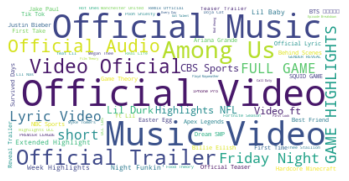

In [ ]:
stopwords = set(STOPWORDS)
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()